In [1]:
from songfp import add_songs_to_database, save_song_database
from songfp import  song_list

In [3]:
import librosa
from glob import glob
import numpy as np

from jupyterthemes import jtplot
jtplot.style()

%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab


In [4]:
import os

In [7]:
add_songs_to_database(africastle)

1 songs added to the database. 

Be sure to run `songfp.save_song_database()


In [6]:
all_songs = []
songs = glob("D:\Ryan's Music\Battles\Gloss Drop\*.mp3")
africastle = songs[0]
futura = songs[2]

all_songs.extend([(africastle, 'afr'), (futura, 'fut')])

afr_x, afr_fs = librosa.load(africastle, sr=44100, mono=True)
fut_x, fut_fs = librosa.load(futura, sr=44100, mono=True)

songs = glob("D:\Ryan's Music\Death Grips\The Money Store\*.mp3")
dg = songs[2]
all_songs.append((dg, 'death'))
death_x, death_fs = librosa.load(dg, sr=44100, mono=True)

songs = glob("D:\Ryan's Music\Bloc Party\Silent Alarm - Bloc Party\*.mp3")
bloc_x, bloc_fs = librosa.load(songs[0], sr=44100, mono=True)
all_songs.append((songs[0], 'bloc'))

bass = r"D:\Ryan's Music\Nicki Minaj\Pink Friday (Deluxe Version) [Explicit]\14 - Super Bass [Explicit].mp3"
all_songs.append((bass, 'superbass'))
bass_x, bass_fs = librosa.load(bass, sr=44100, mono=True)

stell = r"D:\Ryan's Music\Interpol\Turn On The Bright Lights - Interpol\Stella Was A Diver And She Was Always Down - Interpol.mp3"
stell_x, stell_fs = librosa.load(stell, sr=44100, mono=True)
all_songs.append((stell, 'stella'))

slow = r"D:\Ryan's Music\Haim\Days Are Gone\09 Go Slow.mp3"
slow_x, slow_fs = librosa.load(slow, sr=44100, mono=True)
all_songs.append((slow, 'slow'))

prince = r"D:\Ryan's Music\Prince\Purple Rain\07 - I Would Die 4 U.mp3"
prince_x, prince_fs = librosa.load(prince, sr=44100, mono=True)
all_songs.append((prince, 'prince'))

spokey = r"D:\Ryan's Music\Cowboy Bebop\New Bebop\03 Spokey Dokey.mp3"
spokey_x, spokey_fs = librosa.load(spokey, sr=44100, mono=True)
all_songs.append((spokey, 'spokey'))

In [6]:
all_songs[:1]

[("D:\\Ryan's Music\\Battles\\Gloss Drop\\01 - Africastle.mp3", 'afr')]

In [7]:
add_songs_to_database(["D:\\Ryan's Music\\Battles\\Gloss Drop\\01 - Africastle.mp3"])

C:\Users\Ryan Soklaski\Desktop\AudioProject\songfp\functions.py:65: RuntimeWarning: divide by zero encountered in log10
  np.log10(S, out=S)


In [7]:
save_song_database()

In [9]:
import random

def rand_clip(pcm, new, fs=44100):
    if new is None:
        return pcm
    
    old = len(pcm)
    new = int(round(new * fs))
    assert 0 < new <= old
    start = random.randint(0, old - new - 1)
    return pcm[start:start + new]
    

In [10]:
sample_length = 8
afr_sample = rand_clip(np.load('songs\Africastle_clip.npz'), sample_length)
afr_smpl_fs = 44100
# afr_sample = afr_sample[0*afr_sample.shape[0]//5:3*afr_sample.shape[0]//5]


fut_sample = rand_clip(np.load('songs\Futura_clip.npz'), sample_length)
fut_smpl_fs = 44100
pfut_sample = rand_clip(np.load('songs/FuturaPhone_clip.npz'), sample_length)
pfut_smpl_fs = 44100
# fut_sample = fut_sample[0*fut_sample.shape[0]//5:5*fut_sample.shape[0]//5]

death_sample = rand_clip(np.load('songs\LostBoys_clip.npz'), sample_length)
# death_sample = death_x[int(.13*len(death_x)):int(2*.13*len(death_x))]
death_smpl_fs = 44100
# death_sample = death_x[0*death_x.shape[0]//7//45:1*death_x.shape[0]//7//45]

bloc_sample = rand_clip(np.load('songs\Banquet_clip.npz'), sample_length)
bloc_smpl_fs = 44100

pbloc_sample = rand_clip(np.load('songs/BanquetPhone_clip.npz'), sample_length)
pbloc_smpl_fs = 44100

stell_sample = rand_clip(np.load('songs/Stella_clip.npz'), sample_length)
stell_smpl_fs = 44100
pstell_sample = rand_clip(np.load('songs/StellaPhone_clip.npz'), sample_length)
pstell_smpl_fs = 44100

bass_sample = rand_clip(np.load('songs/SuperBass_clip.npz'), sample_length)
bass_smpl_fs = 44100
pbass_sample = rand_clip(np.load('songs/BassPhone_clip.npz'), sample_length)
pbass_smpl_fs = 44100

phone_sample = rand_clip(np.load('songs/AfricastlePhone_clip.npz'), sample_length)
phone_smpl_fs = 44100

slow_sample = rand_clip(np.load('songs/GoSlow_clip.npz'), sample_length)
slow_smpl_fs = 44100
pslow_sample = rand_clip(np.load('songs/SlowPhone_clip.npz'), sample_length)
pslow_smpl_fs = 44100

prince_sample = rand_clip(np.load('songs/PrincePhone_clip.npz'), sample_length)
prince_smpl_fs = 44100

spokey_sample = rand_clip(np.load('songs/SpokeyPhone_clip.npz'), sample_length)
spokey_smpl_fs = 44100

In [11]:
import IPython.display as ipd
ipd.Audio(pfut_sample, rate=44100)

In [13]:
from scipy.ndimage.filters import maximum_filter
import matplotlib.mlab as mlab
from scipy.ndimage.morphology import (generate_binary_structure,
                                      iterate_structure, binary_erosion)
def local_peaks(S, T, F, amp_min, p_nn):
    """ Parameters
        ----------
        S : 2-D array
            Columns are the periodograms of successive segments of a frequency-time
            spectrum.

        T : float
            Time value of maximum time-bin for the spectrum 

        F : float
            Frequency value of maximum frequency-bin for the spectrum

        amp_min : float
            Amplitude threshold applied to local maxima

        p_nn : int
            # Number of cells around an amplitude peak in the spectrogram in order
            # for Dejavu to consider it a spectral peak. Higher values mean less
            # fingerprints and faster matching, but can potentially affect accuracy.

        Returns
        -------
        Tuple[Iterator[float], Iterator[float]]
            time and frequency values of local peaks in spectagram
        """
    # apply log transform since specgram() returns linear array
    #     arr2D = 10 * np.log10(S - S.min() + 1)
    arr2D = 10 * np.log10(S)
    arr2D[arr2D == -np.inf] = 0

    struct = generate_binary_structure(2, 1)
    neighborhood = iterate_structure(struct, p_nn)

    # find local maxima using our fliter shape
    local_max = maximum_filter(arr2D, footprint=neighborhood) == arr2D
    background = (arr2D == 0)
    eroded_background = binary_erosion(background, structure=neighborhood,
                                       border_value=1)

    # Boolean mask of arr2D with True at peaks
    detected_peaks = local_max ^ eroded_background

    # extract peaks
    amps = arr2D[detected_peaks]
    j, i = np.where(detected_peaks)

    # filter peaks
    amps = amps.flatten()
    peaks = zip(i, j, amps)  # time, freq, amp
    peaks_filtered = sorted((x for x in peaks if x[2] > amp_min), 
                            key=lambda x: (x[0], x[1]))  # freq, time, amp

    # get indices for frequency and time
    frequency_idx = (x[1] * F / S.shape[0] for x in peaks_filtered)
    time_idx = (x[0] * T / S.shape[1] for x in peaks_filtered)
    return time_idx, frequency_idx

In [7]:
def plot_spec(data, t, f, fs=44100, xlo=None, xhi=None):
    fig,ax = plt.subplots()

    _, _, _, im = ax.specgram(data * 2**15, NFFT=4096, Fs=fs,
                                     window=mlab.window_hanning,
                                     noverlap=int(4096/2))
    fig.colorbar(im)
    ax.set_xlim(xlo,xhi)
    ax.scatter(t, f, s=4)

In [35]:
def what_song(matches):
    # align by diffs
#     diff_counter = defaultdict(make)
#     largest_count = 0
#     song_id = None
#     for tup in matches:
#         sid, diff = tup
#         diff_counter[diff][sid] += 1

#         if diff_counter[diff][sid] > largest_count:
#             largest_count = diff_counter[diff][sid]
#             song_id = sid
#     print(largest_count)
    o = Counter(matches)
    item, cnt = o.most_common(1)[0]
    print(cnt)
    return item[0]

## Africastle

### Full

In [9]:
afr_S, freqs, bins = mlab.specgram(afr_x * 2**15, NFFT=4096, Fs=afr_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
# fig.colorbar(im)
afr_t, afr_f = local_peaks(afr_S, bins[-1], freqs[-1],10, 20)
afr_t = list(afr_t)
afr_f = list(afr_f)

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:33: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


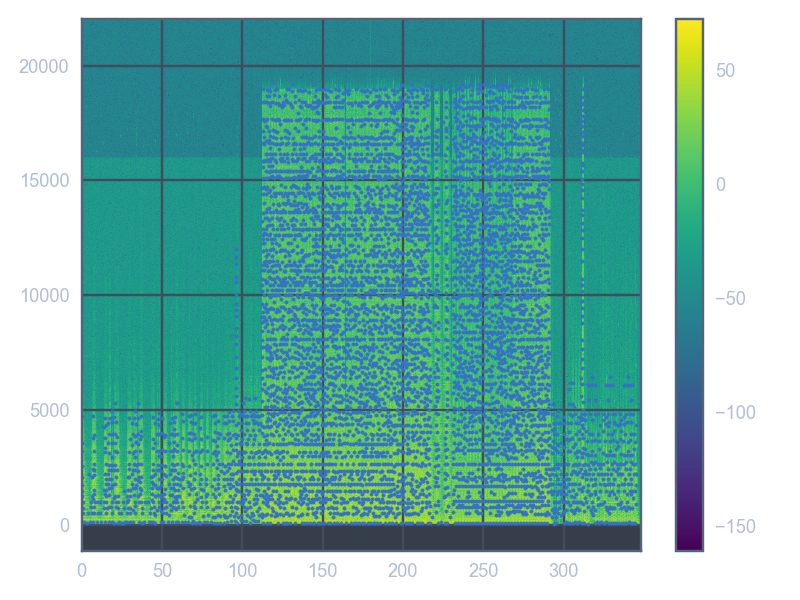

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\axes\_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [12]:
fig,ax = plt.subplots()

afr_S, freqs, bins, im = ax.specgram(afr_x * 2**15, NFFT=4096, Fs=afr_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
# afr_t, afr_f = local_peaks(afr_S, bins[-1], freqs[-1], 30, 20)
afr_t = list(afr_t)
afr_f = list(afr_f)
ax.set_xlim(None,None)
ax.scatter(afr_t, afr_f, s=4)

### Sample

<IPython.core.display.Javascript object>


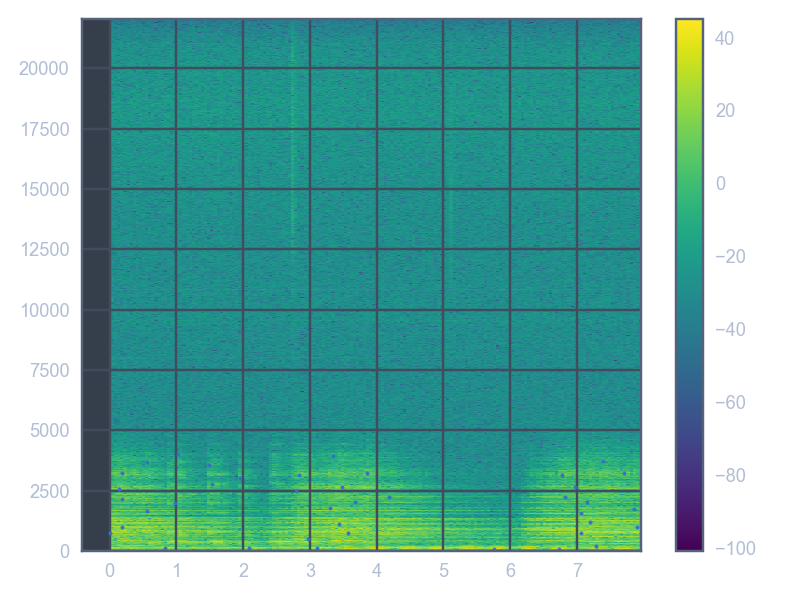

In [14]:
fig,ax = plt.subplots()
afr_smpl_S, freqs, bins, im = ax.specgram(afr_sample, NFFT=4096, Fs=afr_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
afr_smpl_t, afr_smpl_f = local_peaks(afr_smpl_S, bins[-1], freqs[-1],0, 20)
afr_smpl_t = list(afr_smpl_t)
afr_smpl_f = list(afr_smpl_f)
ax.scatter(afr_smpl_t, afr_smpl_f, s=4)

### Phone

<IPython.core.display.Javascript object>


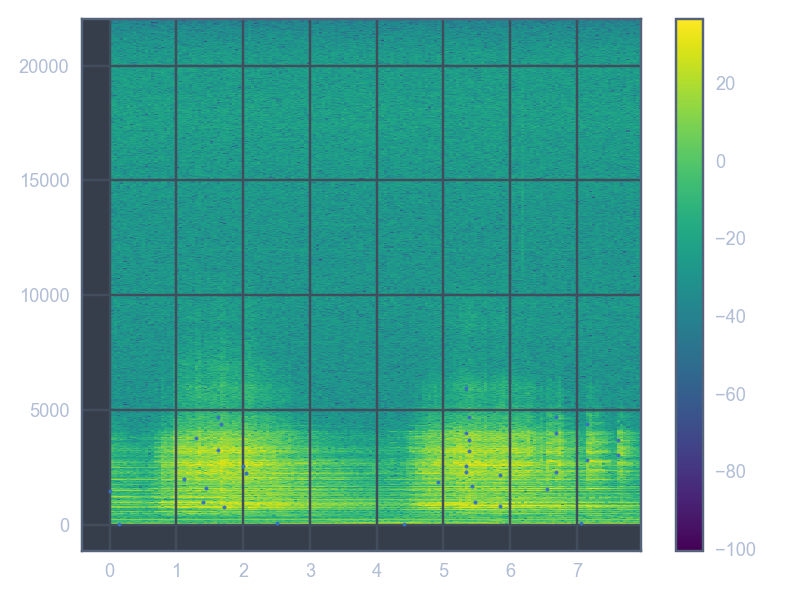

In [15]:
fig,ax = plt.subplots()
phone_smpl_S, freqs, bins, im = ax.specgram(phone_sample, NFFT=4096, Fs=phone_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
phone_smpl_t, phone_smpl_f = local_peaks(phone_smpl_S, bins[-1], freqs[-1],0, 20)
phone_smpl_t = list(phone_smpl_t)
phone_smpl_f = list(phone_smpl_f)
ax.scatter(phone_smpl_t, phone_smpl_f, s=4)

## Futura

### Full

In [14]:
fut_S, freqs, bins = mlab.specgram(fut_x * 2**15, NFFT=4096, Fs=fut_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

fut_t, fut_f = local_peaks(fut_S, bins[-1], freqs[-1],10, 20)
fut_t = list(fut_t)
fut_f = list(fut_f)

<IPython.core.display.Javascript object>


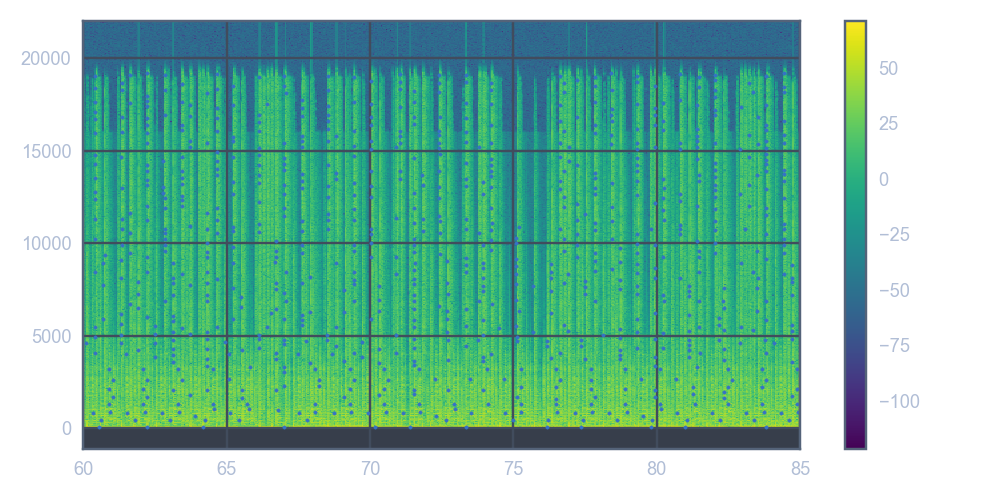

In [34]:
fig,ax = plt.subplots()

fut_S, freqs, bins, im = ax.specgram(fut_x * 2**15, NFFT=4096, Fs=fut_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
# fut_t, fut_f = local_peaks(fut_S, bins[-1], freqs[-1], 30, 20)
fut_t = list(fut_t)
fut_f = list(fut_f)
ax.set_xlim(60,85)
ax.scatter(fut_t, fut_f, s=4)

### Sample

<IPython.core.display.Javascript object>


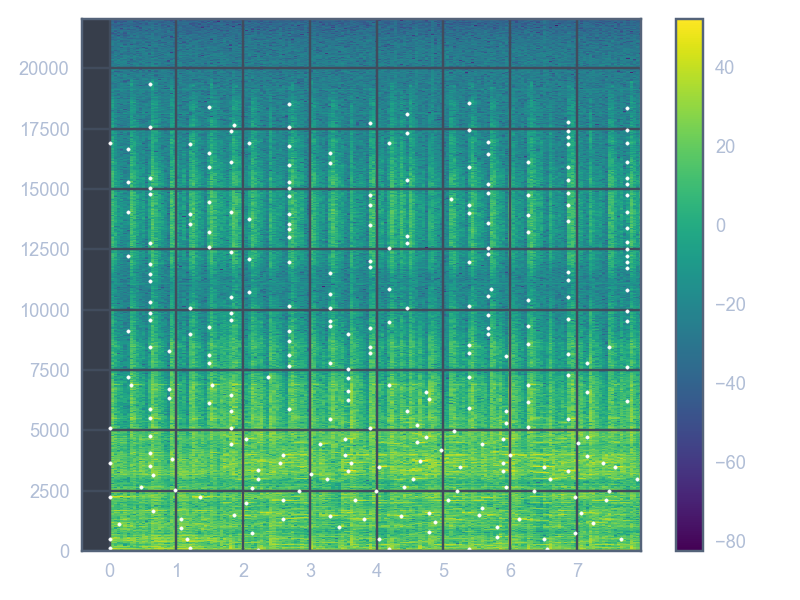

In [16]:
fig,ax = plt.subplots()

fut_smpl_S, freqs, bins, im = ax.specgram(fut_sample, NFFT=4096, Fs=fut_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
fut_smpl_t, fut_smpl_f = local_peaks(fut_smpl_S, bins[-1], freqs[-1], 0, 20)
fut_smpl_t = list(fut_smpl_t)
fut_smpl_f = list(fut_smpl_f)
ax.scatter(fut_smpl_t, fut_smpl_f, s=4, c='white')

### Phone

<IPython.core.display.Javascript object>


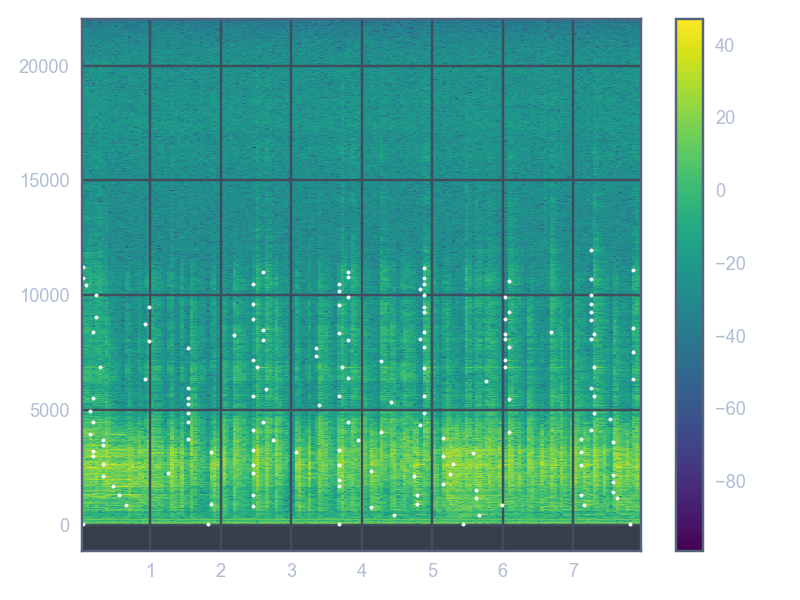

In [17]:
fig,ax = plt.subplots()

pfut_S, freqs, bins, im = ax.specgram(pfut_sample, NFFT=4096, Fs=pfut_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
pfut_t, pfut_f = local_peaks(pfut_S, bins[-1], freqs[-1], 0, 20)
pfut_t = list(pfut_t)
pfut_f = list(pfut_f)
ax.scatter(pfut_t, pfut_f, s=4, c='white')

## Lost Boys
### Full

In [18]:
death_S, freqs, bins = mlab.specgram(death_x * 2**15, NFFT=4096, Fs=death_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

death_t, death_f = local_peaks(death_S, bins[-1], freqs[-1],10, 20)
death_t = list(death_t)
death_f = list(death_f)

<IPython.core.display.Javascript object>


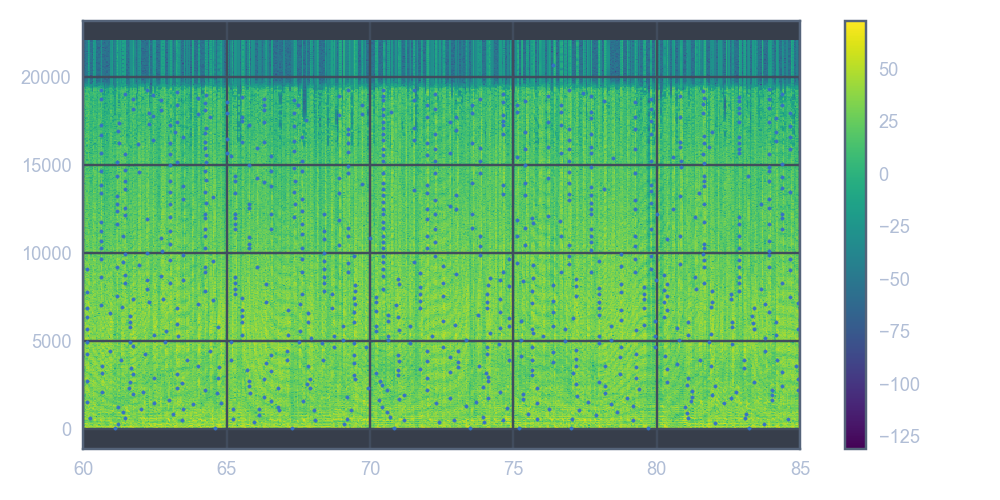

In [36]:
fig,ax = plt.subplots()

death_S, freqs, bins, im = ax.specgram(death_x * 2**15, NFFT=4096, Fs=death_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
# death_t, death_f = local_peaks(death_S, bins[-1], freqs[-1], 30, 20)
death_t = list(death_t)
death_f = list(death_f)
ax.set_xlim(60,85)
ax.scatter(death_t, death_f, s=4)

### Sample

<IPython.core.display.Javascript object>


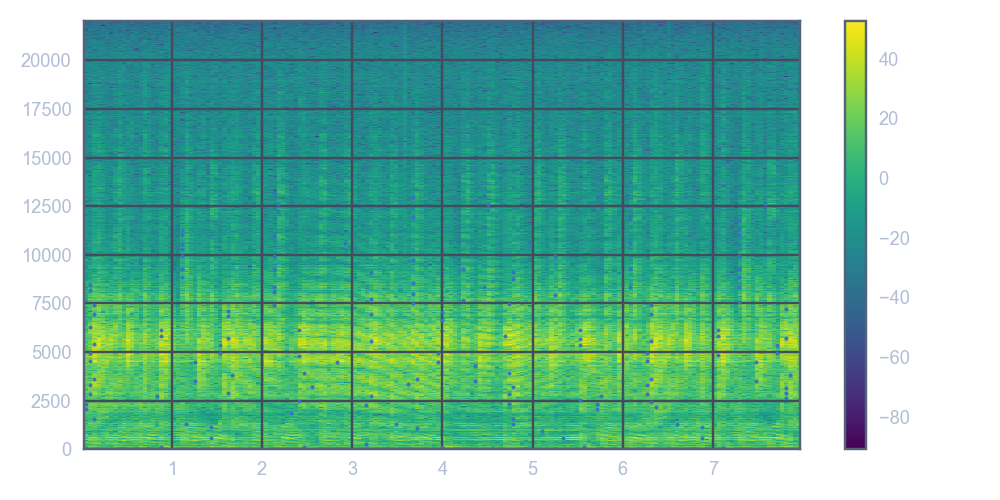

In [37]:
fig,ax = plt.subplots()

death_smpl_S, freqs, bins, im = ax.specgram(death_sample, NFFT=4096, Fs=death_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
death_smpl_t, death_smpl_f = local_peaks(death_smpl_S, bins[-1], freqs[-1], 10, 20)
death_smpl_t = list(death_smpl_t)
death_smpl_f = list(death_smpl_f)
ax.scatter(death_smpl_t, death_smpl_f, s=4)

## Banquet
### Full

In [38]:
bloc_S, freqs, bins = mlab.specgram(bloc_x * 2**15, NFFT=4096, Fs=bloc_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

bloc_t, bloc_f = local_peaks(bloc_S, bins[-1], freqs[-1],25, 20)
bloc_t = list(bloc_t)
bloc_f = list(bloc_f)

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:33: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


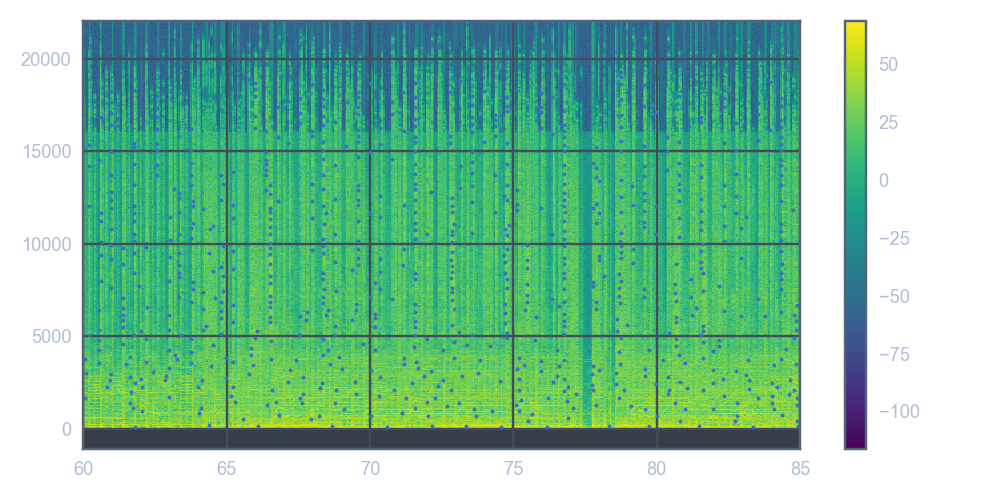

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\axes\_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [39]:
fig,ax = plt.subplots()

bloc_S, freqs, bins, im = ax.specgram(bloc_x * 2**15, NFFT=4096, Fs=bloc_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
# bloc_t, bloc_f = local_peaks(bloc_S, bins[-1], freqs[-1], 30, 20)
bloc_t = list(bloc_t)
bloc_f = list(bloc_f)
ax.set_xlim(60,85)
ax.scatter(bloc_t, bloc_f, s=4)

### Sample

<IPython.core.display.Javascript object>


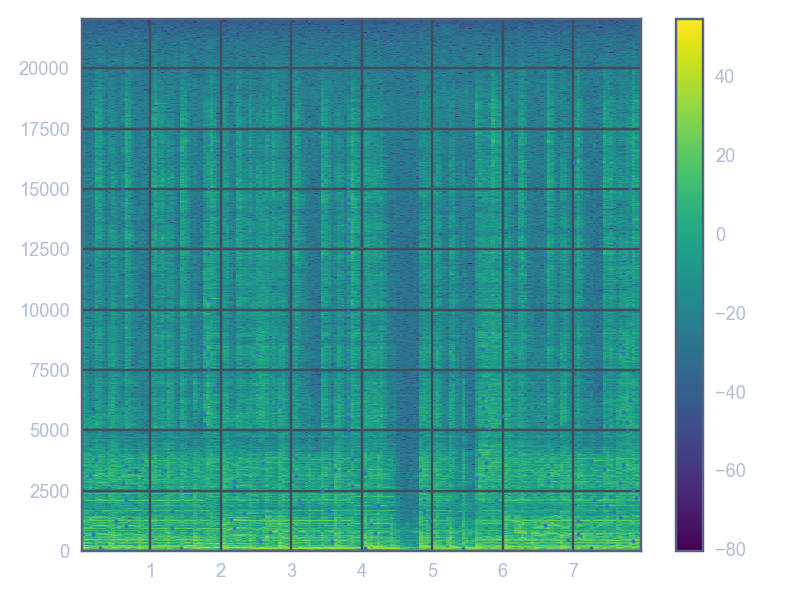

In [18]:
fig,ax = plt.subplots()

bloc_smpl_S, freqs, bins, im = ax.specgram(bloc_sample, NFFT=4096, Fs=bloc_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
bloc_smpl_t, bloc_smpl_f = local_peaks(bloc_smpl_S, bins[-1], freqs[-1], 10, 20)
bloc_smpl_t = list(bloc_smpl_t)
bloc_smpl_f = list(bloc_smpl_f)
ax.scatter(bloc_smpl_t, bloc_smpl_f, s=4)

### Phone

<IPython.core.display.Javascript object>


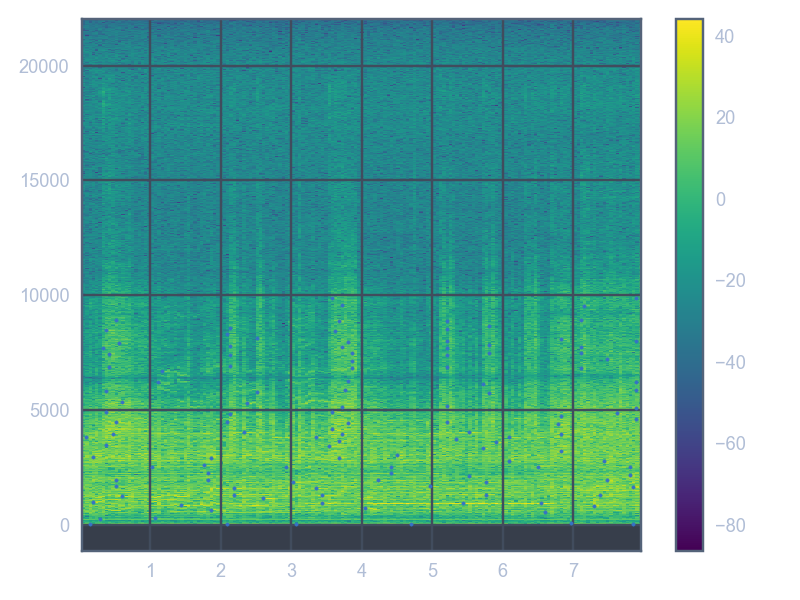

In [19]:
fig,ax = plt.subplots()

pbloc_smpl_S, freqs, bins, im = ax.specgram(pbloc_sample, NFFT=4096, Fs=pbloc_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
pbloc_smpl_t, pbloc_smpl_f = local_peaks(pbloc_smpl_S, bins[-1], freqs[-1], 10, 20)
pbloc_smpl_t = list(pbloc_smpl_t)
pbloc_smpl_f = list(pbloc_smpl_f)
ax.scatter(pbloc_smpl_t, pbloc_smpl_f, s=4)

## Go Slow

In [42]:
slow_S, freqs, bins = mlab.specgram(slow_x * 2**15, NFFT=4096, Fs=slow_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

slow_t, slow_f = local_peaks(slow_S, bins[-1], freqs[-1],25, 20)
slow_t = list(slow_t)
slow_f = list(slow_f)

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:33: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


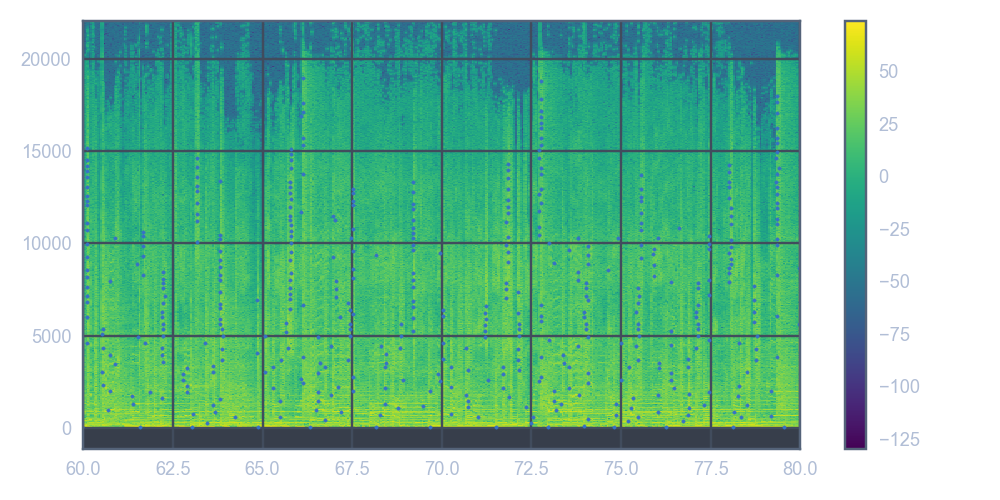

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\axes\_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [43]:
plot_spec(slow_x, slow_t, slow_f, xlo=60, xhi=80)

### Sample

<IPython.core.display.Javascript object>


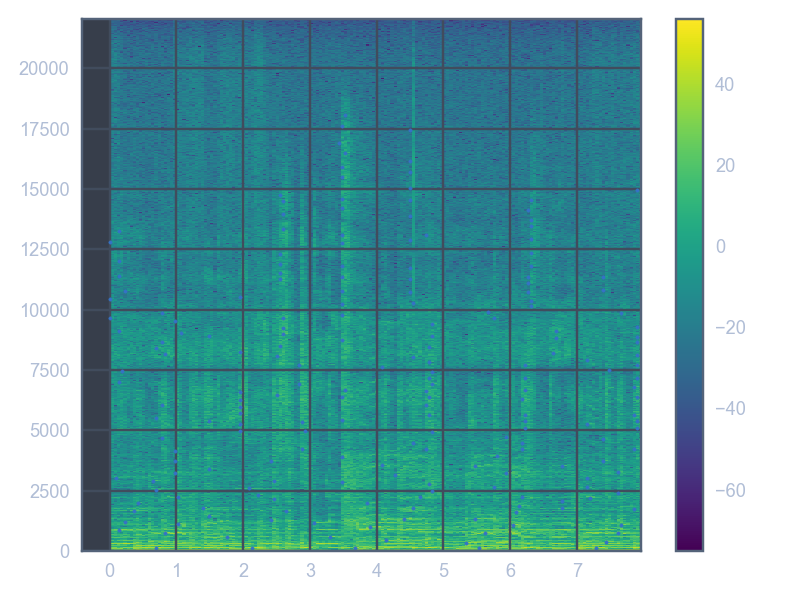

In [20]:
fig,ax = plt.subplots()
slow_smpl_S, freqs, bins, im = ax.specgram(slow_sample, NFFT=4096, Fs=slow_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
slow_smpl_t, slow_smpl_f = local_peaks(slow_smpl_S, bins[-1], freqs[-1],0, 20)
slow_smpl_t = list(slow_smpl_t)
slow_smpl_f = list(slow_smpl_f)
ax.scatter(slow_smpl_t, slow_smpl_f, s=4)

### Phone

<IPython.core.display.Javascript object>


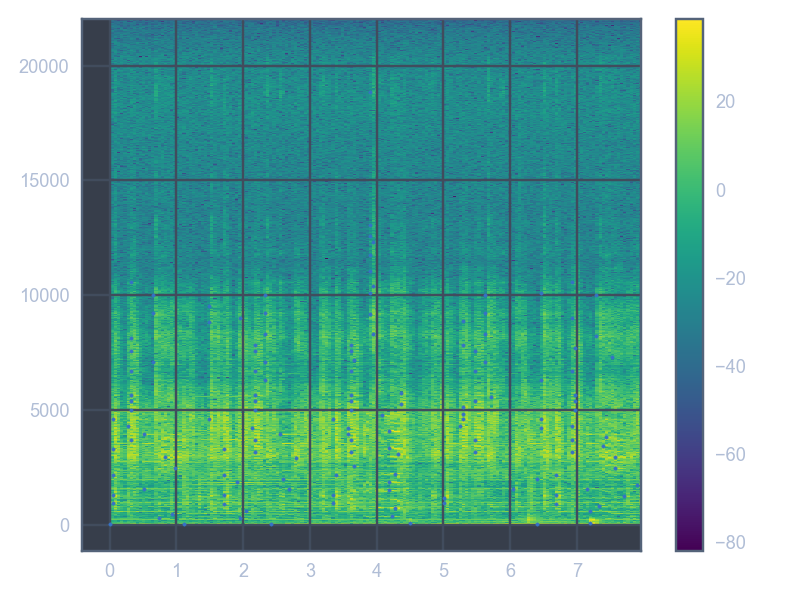

In [21]:
fig,ax = plt.subplots()
pslow_smpl_S, freqs, bins, im = ax.specgram(pslow_sample, NFFT=4096, Fs=pslow_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
pslow_smpl_t, pslow_smpl_f = local_peaks(pslow_smpl_S, bins[-1], freqs[-1],0, 20)
pslow_smpl_t = list(pslow_smpl_t)
pslow_smpl_f = list(pslow_smpl_f)
ax.scatter(pslow_smpl_t, pslow_smpl_f, s=4)

## Stella

In [60]:
stell_S, freqs, bins = mlab.specgram(stell_x * 2**15, NFFT=4096, Fs=stell_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

stell_t, stell_f = local_peaks(stell_S, bins[-1], freqs[-1],30, 20)
stell_t = list(stell_t)
stell_f = list(stell_f)

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:33: RuntimeWarning: divide by zero encountered in log10


# Stella Was a Diver

<IPython.core.display.Javascript object>


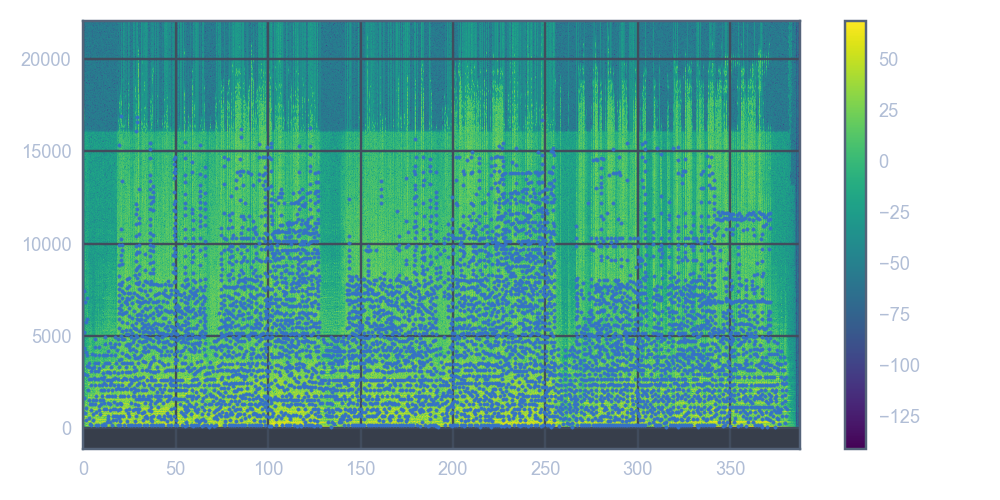

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\axes\_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [47]:
plot_spec(stell_x, stell_t, stell_f, xlo=None, xhi=None)

### Sample

<IPython.core.display.Javascript object>


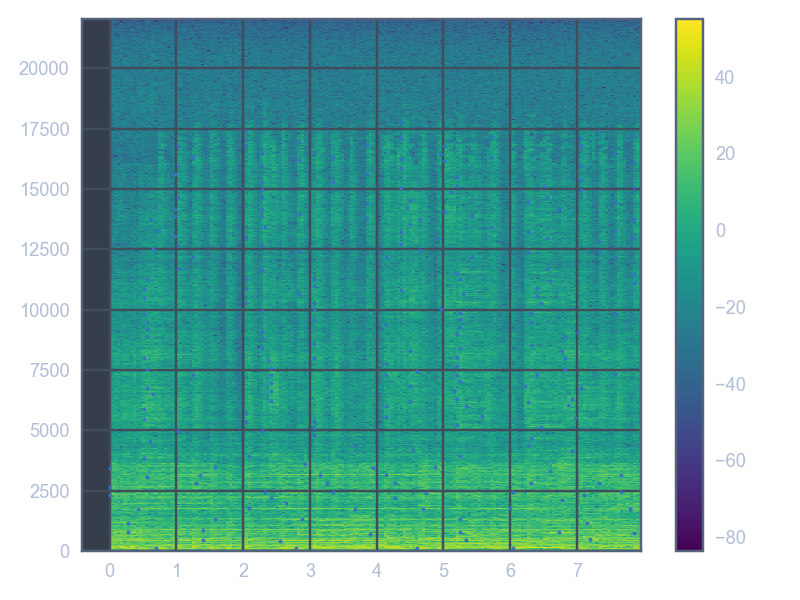

In [22]:
fig,ax = plt.subplots()
stell_smpl_S, freqs, bins, im = ax.specgram(stell_sample, NFFT=4096, Fs=stell_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
stell_smpl_t, stell_smpl_f = local_peaks(stell_smpl_S, bins[-1], freqs[-1],0, 20)
stell_smpl_t = list(stell_smpl_t)
stell_smpl_f = list(stell_smpl_f)
ax.scatter(stell_smpl_t, stell_smpl_f, s=4)

### Phone

<IPython.core.display.Javascript object>


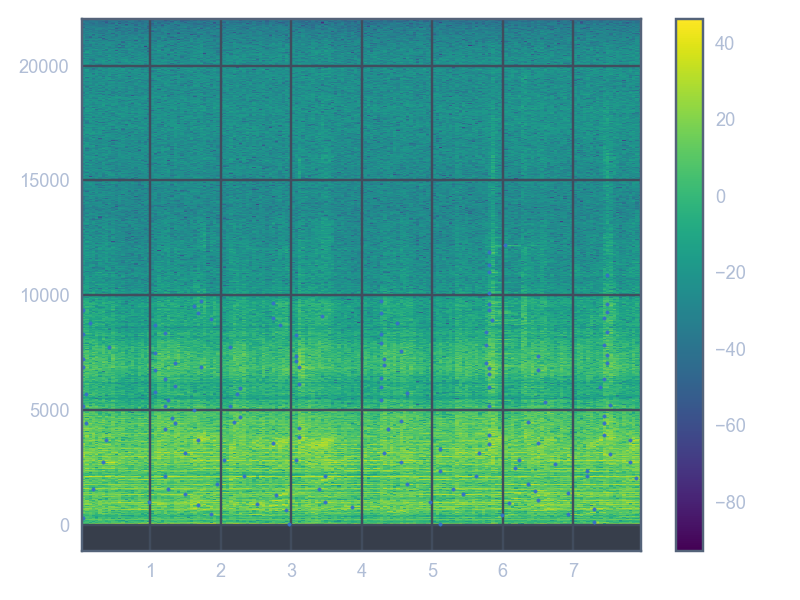

In [23]:
fig,ax = plt.subplots()
pstell_smpl_S, freqs, bins, im = ax.specgram(pstell_sample, NFFT=4096, Fs=pstell_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
pstell_smpl_t, pstell_smpl_f = local_peaks(pstell_smpl_S, bins[-1], freqs[-1],0, 20)
pstell_smpl_t = list(pstell_smpl_t)
pstell_smpl_f = list(pstell_smpl_f)
ax.scatter(pstell_smpl_t, pstell_smpl_f, s=4)

## Super Bass

In [24]:
bass_S, freqs, bins = mlab.specgram(bass_x * 2**15, NFFT=4096, Fs=bass_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

bass_t, bass_f = local_peaks(bass_S, bins[-1], freqs[-1],30, 20)
bass_t = list(bass_t)
bass_f = list(bass_f)

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:33: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


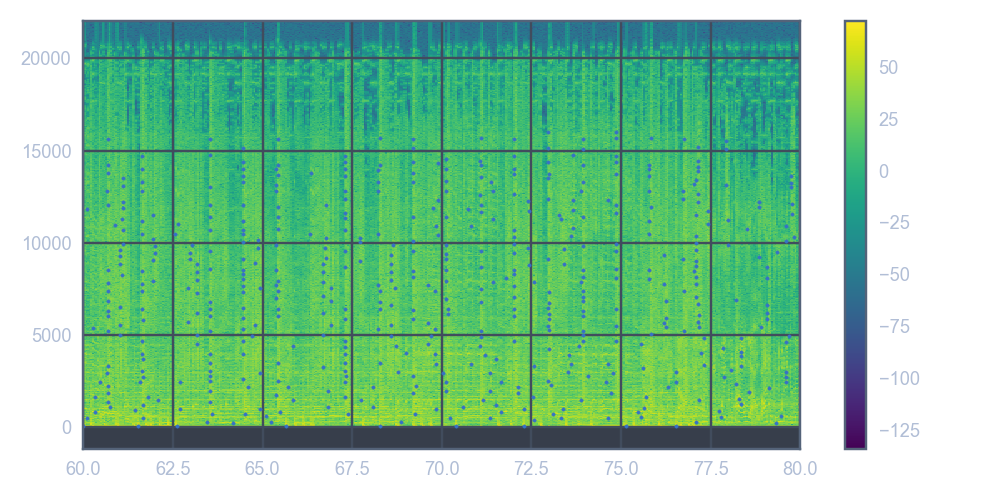

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\axes\_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [51]:
plot_spec(bass_x, bass_t, bass_f, xlo=60, xhi=80)

### Sample

<IPython.core.display.Javascript object>


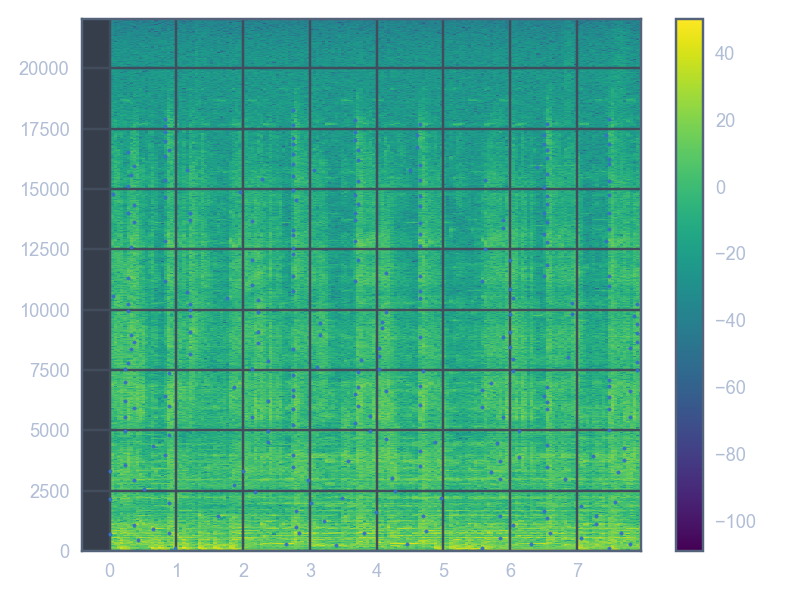

In [25]:
fig,ax = plt.subplots()
bass_smpl_S, freqs, bins, im = ax.specgram(bass_sample, NFFT=4096, Fs=bass_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
bass_smpl_t, bass_smpl_f = local_peaks(bass_smpl_S, bins[-1], freqs[-1],0, 20)
bass_smpl_t = list(bass_smpl_t)
bass_smpl_f = list(bass_smpl_f)
ax.scatter(bass_smpl_t, bass_smpl_f, s=4)

### Phone

<IPython.core.display.Javascript object>


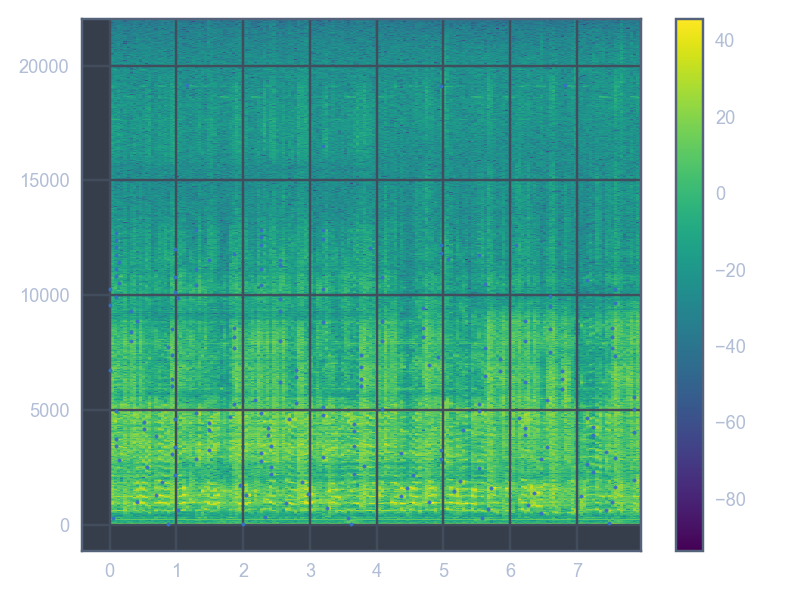

In [26]:
fig,ax = plt.subplots()
pbass_smpl_S, freqs, bins, im = ax.specgram(pbass_sample, NFFT=4096, Fs=pbass_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
pbass_smpl_t, pbass_smpl_f = local_peaks(pbass_smpl_S, bins[-1], freqs[-1],0, 20)
pbass_smpl_t = list(pbass_smpl_t)
pbass_smpl_f = list(pbass_smpl_f)
ax.scatter(pbass_smpl_t, pbass_smpl_f, s=4)

## I Would Die 4 U

In [54]:
prince_S, freqs, bins = mlab.specgram(prince_x * 2**15, NFFT=4096, Fs=prince_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

prince_t, prince_f = local_peaks(prince_S, bins[-1], freqs[-1],30, 20)
prince_t = list(prince_t)
prince_f = list(prince_f)

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:33: RuntimeWarning: divide by zero encountered in log10


<IPython.core.display.Javascript object>


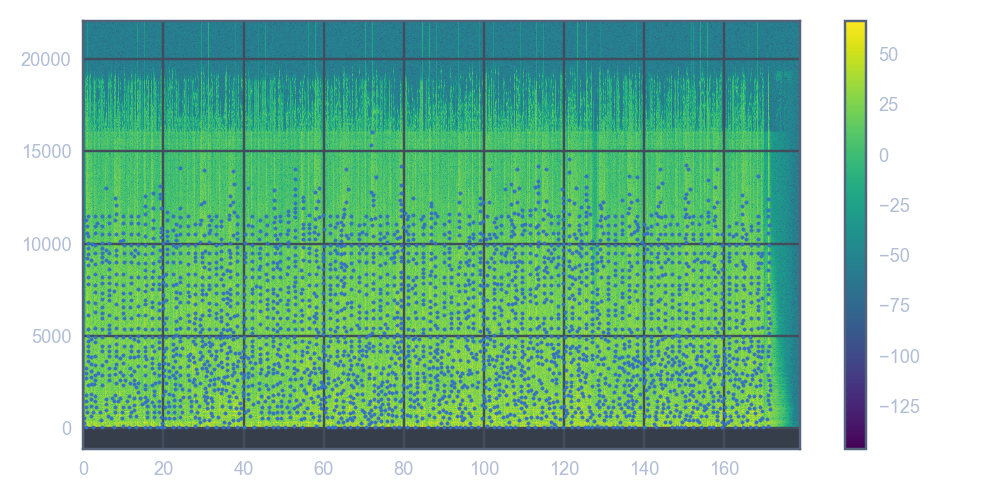

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\axes\_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [55]:
plot_spec(prince_x, prince_t, prince_f, xlo=None, xhi=None)

### Phone

<IPython.core.display.Javascript object>


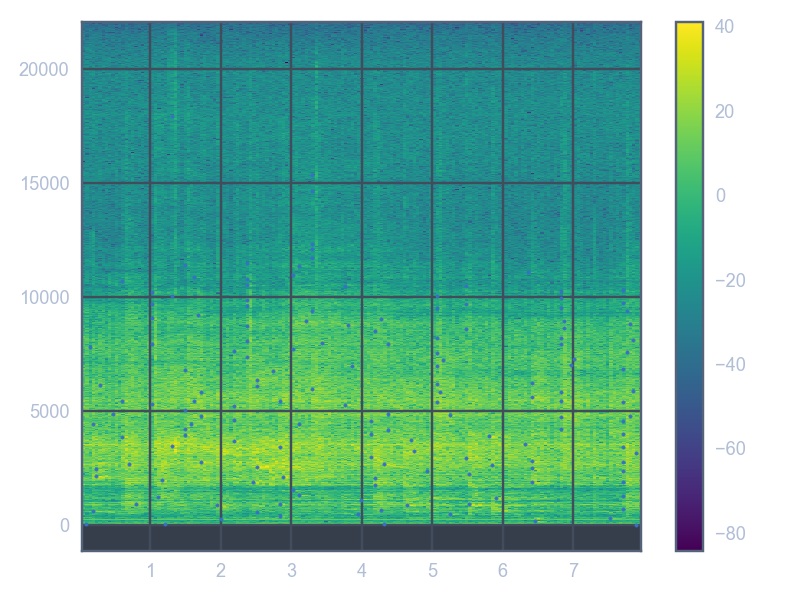

In [27]:
fig,ax = plt.subplots()
prince_smpl_S, freqs, bins, im = ax.specgram(prince_sample, NFFT=4096, Fs=prince_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
prince_smpl_t, prince_smpl_f = local_peaks(prince_smpl_S, bins[-1], freqs[-1],0, 20)
prince_smpl_t = list(prince_smpl_t)
prince_smpl_f = list(prince_smpl_f)
ax.scatter(prince_smpl_t, prince_smpl_f, s=4)

## Spokey

In [57]:
spokey_S, freqs, bins = mlab.specgram(spokey_x * 2**15, NFFT=4096, Fs=spokey_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))

spokey_t, spokey_f = local_peaks(spokey_S, bins[-1], freqs[-1],30, 20)
spokey_t = list(spokey_t)
spokey_f = list(spokey_f)

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:33: RuntimeWarning: divide by zero encountered in log10


In [129]:
freqs.shape

(2049,)

<IPython.core.display.Javascript object>


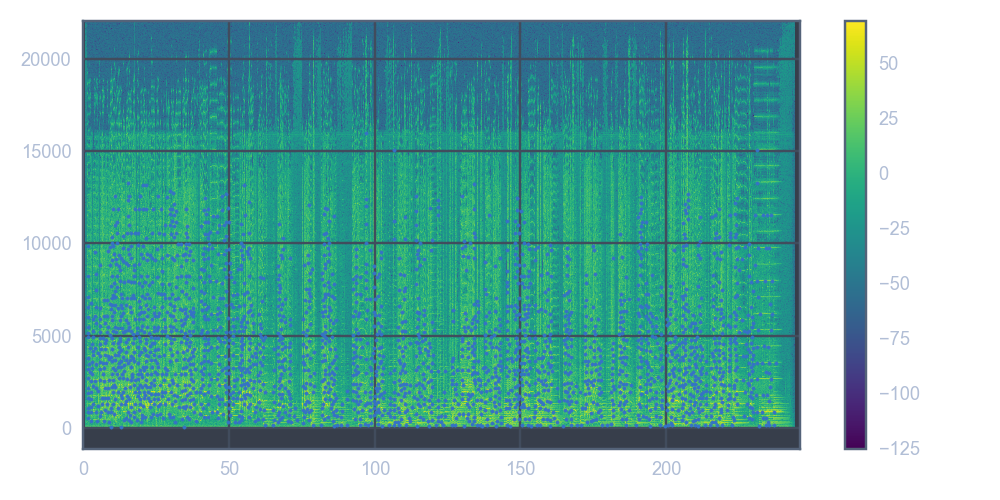

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\axes\_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [58]:
plot_spec(spokey_x, spokey_t, spokey_f, xlo=None, xhi=None)

### Phone

<IPython.core.display.Javascript object>


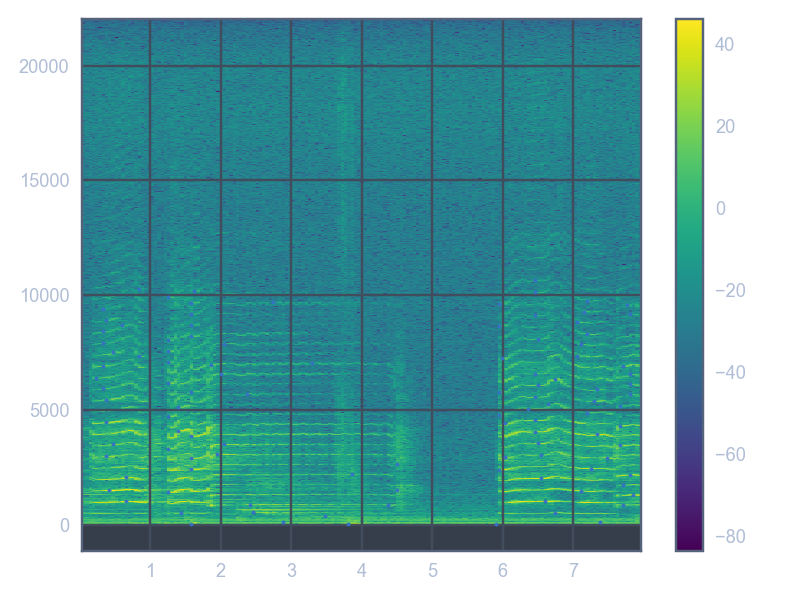

In [28]:
fig,ax = plt.subplots()
spokey_smpl_S, freqs, bins, im = ax.specgram(spokey_sample, NFFT=4096, Fs=spokey_smpl_fs,
                                 window=mlab.window_hanning,
                                 noverlap=int(4096/2))
fig.colorbar(im)
spokey_smpl_t, spokey_smpl_f = local_peaks(spokey_smpl_S, bins[-1], freqs[-1],0, 20)
spokey_smpl_t = list(spokey_smpl_t)
spokey_smpl_f = list(spokey_smpl_f)
ax.scatter(spokey_smpl_t, spokey_smpl_f, s=4)

# Hashing

In [15]:
from collections import defaultdict

In [30]:
import hashlib
def generate_hashes(peaks, fan_value=15, min_d=0, max_d=15):
    """
    Hash list structure:
       sha1_hash[0:20]    time_offset
    [(e05b341a9b77a51fd26, 32), ... ]
    """

    #peaks = [(np.round(t, 3).astype(np.float16), round(f,1)) for t, f in peaks]
    peaks = list(peaks)
    for i in range(len(peaks)):
        freq1 = peaks[i][1]
        for j in range(1, fan_value):
            if (i + j) == len(peaks):
                break

            freq2 = peaks[i + j][1]
            t1 = peaks[i][0]
            t2 = peaks[i + j][0]
            t_delta = t2 - t1

            if min_d <= t_delta <= max_d:
                yield ((freq1, freq2), t1)
#                 h = hashlib.sha1("{}|{}|{}".format(freq1, freq2, t_delta).encode())
#                 yield (h.hexdigest()[0:20], t1)
            elif max_d < t_delta:
                break

In [63]:
db = defaultdict(list)
  
sid = 'afr'
for key, t in generate_hashes(zip(afr_t, afr_f)):
    db[key].append((sid, t))

    
# sid = 'fut'
# for key, t in generate_hashes(zip(fut_t, fut_f)):
#     db[key].append((sid, t))
    
# sid = 'death'
# for key, t in generate_hashes(zip(death_t, death_f)):
#     db[key].append((sid, t))

# sid = 'bloc'
# for key, t in generate_hashes(zip(bloc_t, bloc_f)):
#     db[key].append((sid, t))
    
sid = 'stell'
for key, t in generate_hashes(zip(stell_t, stell_f)):
    db[key].append((sid, t))    
    
# sid = 'slow'
# for key, t in generate_hashes(zip(slow_t, slow_f)):
#     db[key].append((sid, t))

# sid = 'bass'
# for key, t in generate_hashes(zip(bass_t, bass_f)):
#     db[key].append((sid, t))

# sid = 'prince'
# for key, t in generate_hashes(zip(prince_t, prince_f)):
#     db[key].append((sid, t))

# sid = 'spokey'
# for key, t in generate_hashes(zip(spokey_t, spokey_f)):
#     db[key].append((sid, t))

In [33]:
def from_dict(it, d):
    for i, t2 in it:
        o = d.get(i)
        if o is not None:
            for s_id, t1 in o:
                yield (s_id, np.round(t2-t1, 2).astype(np.float32))

In [37]:
db = database
from collections import Counter

In [38]:
afr_smpl_keys = generate_hashes(zip(afr_smpl_t, afr_smpl_f))
afr_matches = from_dict(afr_smpl_keys, db)
what_song(afr_matches) == 'afr'

100


True

In [39]:
phone_smpl_keys = (i for i in generate_hashes(zip(phone_smpl_t, phone_smpl_f)))
phone_matches = list(from_dict(phone_smpl_keys, db))
what_song(phone_matches) == 'afr'

208


True

In [40]:
fut_smpl_keys = (i for i in generate_hashes(zip(fut_smpl_t, fut_smpl_f)))
fut_matches = list(from_dict(fut_smpl_keys, db))
what_song(fut_matches) == 'fut'

10


False

In [41]:
pfut_smpl_keys = (i for i in generate_hashes(zip(pfut_t, pfut_f)))
pfut_matches = list(from_dict(pfut_smpl_keys, db))
what_song(pfut_matches) == 'fut'

25


True

In [43]:
death_smpl_keys = (i for i in generate_hashes(zip(death_smpl_t, death_smpl_f)))
death_matches = list(from_dict(death_smpl_keys, db))
what_song(death_matches) == 'death'

NameError: name 'death_smpl_t' is not defined

In [44]:
bloc_smpl_keys = (i for i in generate_hashes(zip(bloc_smpl_t, bloc_smpl_f)))
bloc_matches = list(from_dict(bloc_smpl_keys, db))
what_song(bloc_matches) == "bloc"

115


True

In [45]:
pbloc_smpl_keys = (i for i in generate_hashes(zip(pbloc_smpl_t, pbloc_smpl_f)))
pbloc_matches = list(from_dict(pbloc_smpl_keys, db))
what_song(pbloc_matches) == "bloc"

238


True

In [46]:
stell_smpl_keys = (i for i in generate_hashes(zip(stell_smpl_t, stell_smpl_f)))
stell_matches = list(from_dict(stell_smpl_keys, db))
what_song(stell_matches) == 'stell'

316


False

In [47]:
pstell_smpl_keys = (i for i in generate_hashes(zip(pstell_smpl_t, pstell_smpl_f)))
pstell_matches = list(from_dict(pstell_smpl_keys, db))
what_song(pstell_matches) == 'stell'

210


False

In [188]:
slow_smpl_keys = (i for i in generate_hashes(zip(slow_smpl_t, slow_smpl_f)))
slow_matches = list(from_dict(slow_smpl_keys, db))
what_song(slow_matches) == 'slow'

47


True

In [48]:
pslow_smpl_keys = (i for i in generate_hashes(zip(pslow_smpl_t, pslow_smpl_f)))
pslow_matches = list(from_dict(pslow_smpl_keys, db))
what_song(pslow_matches) == 'slow'

127


True

In [49]:
bass_smpl_keys = (i for i in generate_hashes(zip(bass_smpl_t, bass_smpl_f)))
bass_matches = list(from_dict(bass_smpl_keys, db))
what_song(bass_matches) == 'bass'

60


False

In [50]:
pbass_smpl_keys = (i for i in generate_hashes(zip(pbass_smpl_t, pbass_smpl_f)))
pbass_matches = list(from_dict(pbass_smpl_keys, db))
what_song(pbass_matches) == 'bass'

131


False

In [51]:
prince_smpl_keys = (i for i in generate_hashes(zip(prince_smpl_t, prince_smpl_f)))
prince_matches = list(from_dict(prince_smpl_keys, db))
what_song(prince_matches) == 'prince'

231


True

In [193]:
spokey_smpl_keys = (i for i in generate_hashes(zip(spokey_smpl_t, spokey_smpl_f)))
spokey_matches = list(from_dict(spokey_smpl_keys, db))
what_song(spokey_matches) == 'spokey'

188


True

In [136]:
afr_fs

44100

In [134]:
np.log2(2049)

11.000704269011246

In [137]:
prince_S.shape

(2049, 3852)

In [89]:
def amp_cdf(S,cut, plot=False):
    y = np.ma.masked_invalid(10*np.log10(S)).compressed()
    ys, xs = np.histogram(y, bins=1000, normed=True)
    dx = xs[-1] - xs[-2]
    cdf = np.cumsum(ys)*dx
    if plot:
        fig, ax = plt.subplots()
        ax.plot(xs[:-1], cdf)
        ax.vlines(cut, 0, 1)
    return cdf[np.searchsorted(xs, cut)]
    

In [651]:
np.searchsorted(xs, 10)

70

In [85]:
amp_cut = dict(afr=10,
               fut=10,
               death=10,
               bloc=25,
               slow=25, 
               stella=30,
               bass=30,
               prince=30,
               spokey=30,
              safr=0,
              sfut=0,
              sdeath=10,
              sbloc=10,
              sslow=0,
              sstell=0,
              sbass=0,
              sprince=0,
              sspokey=0)

In [118]:
def amp_cdf(S,cut, plot=False):
    y = np.ma.masked_invalid(10*np.log10(S)).compressed()
    ys, xs = np.histogram(y, bins=1000, normed=True)
    dx = xs[-1] - xs[-2]
    cdf = np.cumsum(ys)*dx
    if plot:
        fig, ax = plt.subplots()
        ax.plot(xs[:-1], cdf)
        ax.vlines(cut, 0, 1)
    return cdf, xs, ys

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:2: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
C:\Anaconda\envs\py35\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


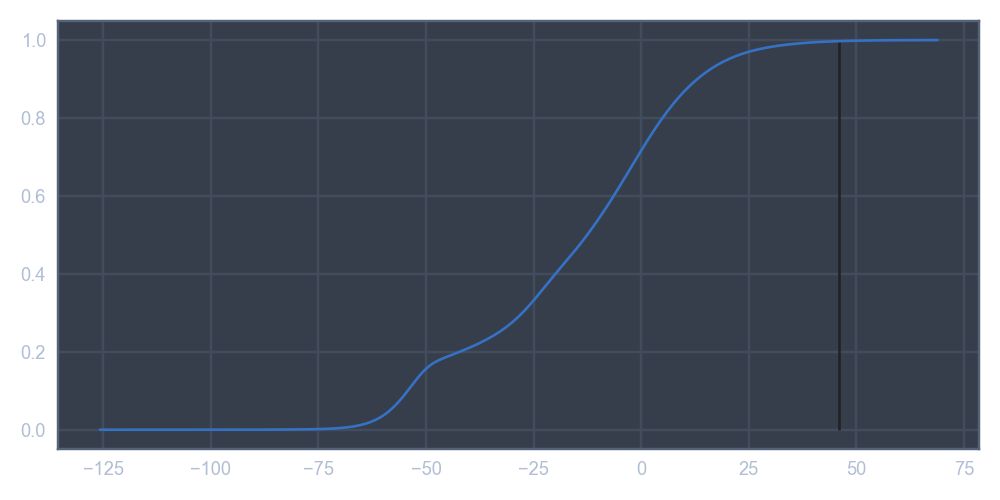

In [124]:
a,b,c = amp_cdf(spokey_S,46, True)

In [125]:
np.searchsorted(a, .98)

794

In [ ]:
if normed:
    pcm = pcm * 2**15
assert 0. <= frac_cut <= 1.
S, freqs, bins = mlab.specgram(pcm * 2 ** 15, NFFT=4096, Fs=fs,
                               window=mlab.window_hanning,
                               noverlap=int(4096 / 2))

# map spectragram to log-scale intensities
np.log10(S, out=S)
S *= 10

y = np.ma.masked_invalid(S).compressed()
ys, xs = np.histogram(y, bins=len(freqs)//2, normed=True)
dx = xs[-1] - xs[-2]
cdf = np.cumsum(ys)*dx
cutoff = xs[np.searchsorted(cdf, frac_cut)]

In [131]:
c

array([  4.77492667e-07,   0.00000000e+00,   4.77492667e-07,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         4.77492667e-07,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         4.77492667e-07,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   4.77492667e-07,   0.00000000e+00,
         4.77492667e-07,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00,   4.77492667e-07,   4.77492667e-07,
         0.00000000e+00,

In [130]:
b

array([-125.76705786, -125.57222462, -125.37739138, ...,   68.67651378,
         68.87134702,   69.06618025])

In [126]:
b[794]

28.930533203793672

In [101]:
Ss = [afr_S, fut_S, death_S, bloc_S, slow_S, bass_S, prince_S, spokey_S]
names = ['afr', 'fut', 'death', 'bloc', 'slow', 'bass', 'prince', 'spokey']

In [90]:
cuts = [amp_cdf(S, amp_cut[name]) for S,name in zip(Ss, names)]

C:\Anaconda\envs\py35\lib\site-packages\ipykernel\__main__.py:2: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app


In [92]:
afr_S.shape

(2049, 7497)

In [69]:
cuts = [0.70870647130619757,
 0.62258954855452542,
 0.33793451609831854,
 0.82359581654277225,
 0.87601715674278657,
 0.88770976352316966,
 0.90706217160096236,
 0.98251920587614749]

In [82]:
np.mean(cuts)

0.76826683128060991

In [83]:
cuts = [0.77499624770181819,
 0.68520593316578826,
 0.39646742565801613,
 0.867743856838327,
 0.89862731415755537,
 0.92167551209082099,
 0.93633511437318506,
 0.9855350991817492]

In [84]:
np.mean(cuts)

0.80832331289590753

In [93]:
Ss = [phone_smpl_S, pfut_S, pbloc_smpl_S, pslow_smpl_S, pbass_smpl_S, prince_smpl_S, spokey_smpl_S]
names = ['safr', 'sfut', 'sbloc', 'sslow', 'sbass', 'sprince', 'sspokey']

In [94]:
cuts = [amp_cdf(S, amp_cut[name]) for S,name in zip(Ss, names)]

In [95]:
cuts

[0.89140616304060982,
 0.81284837276210176,
 0.88125144486396612,
 0.76703227076963043,
 0.75201139337680978,
 0.6673230987016634,
 0.90095582212397141]

In [ ]:
prince_smpl_S

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


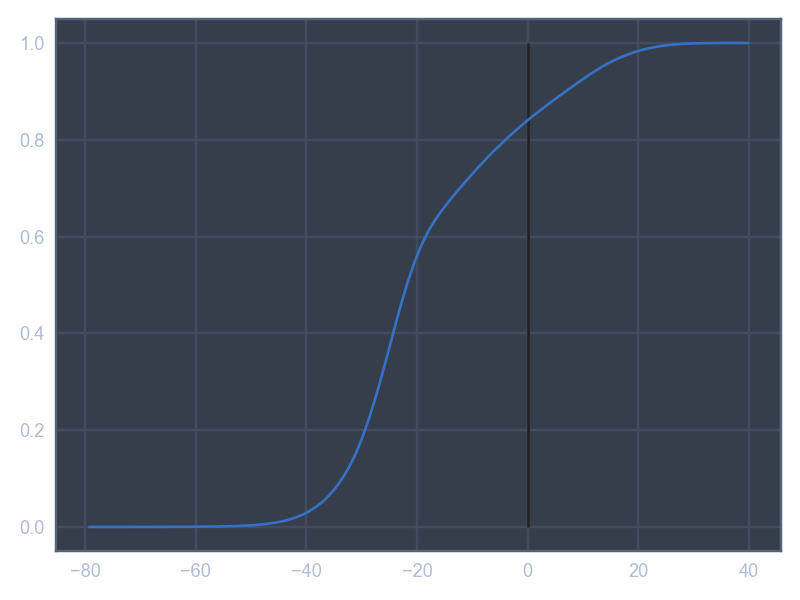

0.84188550112878213

In [674]:
amp_cdf(pfut_S, amp_cut['sfut'], plot=True)

C:\Anaconda\envs\py35\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


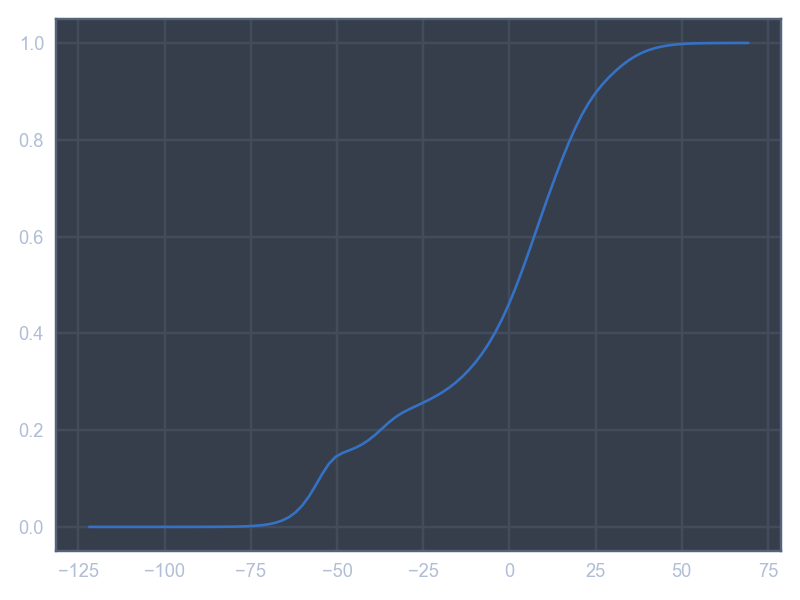

In [603]:
xs, ys = amp_cdf(fut_S)